# Plotting some rates

This is the first notebook, so just plotting around, and will condense into functions in single_neuron_utils.py under utils

In [1]:
import numpy as np 
import sys
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import scipy
import os
import importlib
import pandas as pd

sys.path.append('/home/nuttidalab/Documents/spikeRNN/analysis/utils')
import load_data as ld 
import single_neuron_utils as sn 
from bootstrap_method import *



In [2]:
# bootstrapping params
random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)  # 95% confidence interval

In [3]:
delay = 150
condn_phrase = 'delay'
condn_num = 150

# condn_key = f'{condn_phrase}{condn_num}'

In [4]:
# find folder names within model directory
all_models_dir = '/scratch/all_DMS_models/'

model_dirs = ld.get_immediate_subdirs(all_models_dir)
print(model_dirs)


['Task_xor_N_200_Taus_4.0_25.0_Act_sigmoid_2019_09_06_152659']


In [5]:
# choose model 0 to visualize for now
model_name = model_dirs[0]
model_dir = os.path.join(all_models_dir, model_name)

# find files for this delay of interest
data_files = ld.find_files_keywords(model_dir, [f'delay{delay}'])

## Let's load the data

In [7]:
# neural data
importlib.reload(ld)
lfp_data, spk_times_df, rates_data = ld.load_neural_data(model_name, condn_phrase, condn_num,
                                                  load_LFP=True, load_spikes=True, load_rates=True)
# behavioral data
trial_labels, trial_perfs = ld.load_bhv_data(model_name, condn_phrase='delay', condn_num=delay)

# timing data
_, times_real, fs_dict = ld.load_timing_data(model_name, condn_phrase='delay', condn_num=delay)


#### plot rates

In [8]:
rates_data.shape

(2055, 200, 1000)

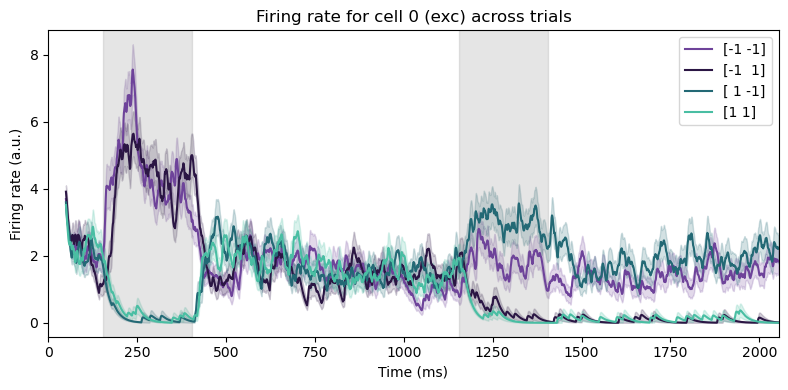

In [31]:
importlib.reload(sn)

sn.plot_neuron_rates(model_name, 0, condn_phrase, condn_num, cut_off=50)

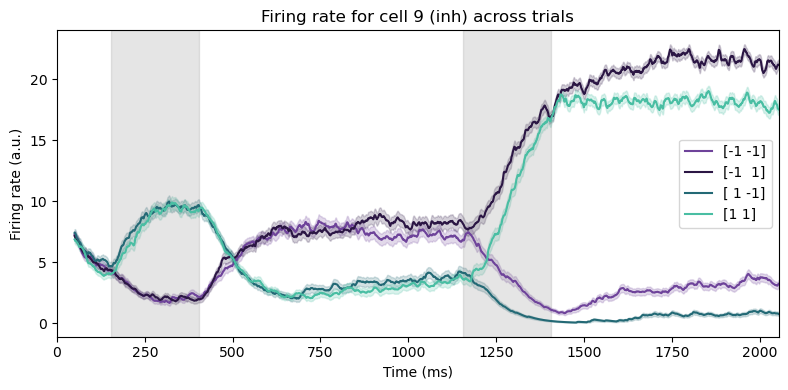

In [30]:
importlib.reload(sn)
sn.plot_neuron_rates(model_name, 9, condn_phrase, condn_num, cut_off=50)

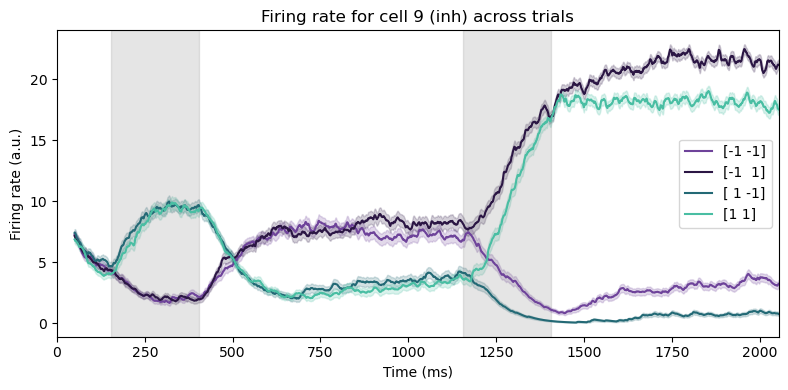

In [55]:
importlib.reload(sn)
sn.plot_neuron_rates(model_name, 9, condn_phrase, condn_num, cut_off=50)

In [44]:
importlib.reload(ld)
connectivity_df = ld.get_connectivity_df(model_name)

In [50]:
# find when neuron 9 is postsynaptic
connectivity_df[connectivity_df['postsyn_id'] == 9]

,presyn_id,postsyn_id,weight,presyn_type,postsyn_type
148,28,9,-0.066331,inh,inh
891,114,9,-0.065716,inh,inh
1462,177,9,-0.030312,inh,inh
1500,179,9,-0.077452,inh,inh


Neuron 28 is pre-synaptic to neuron 9


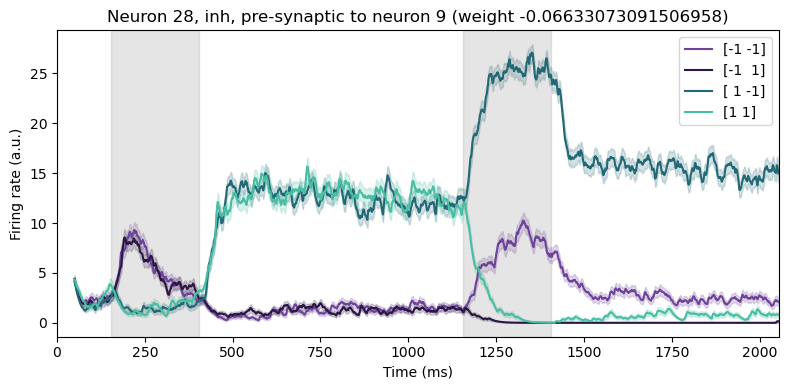

Neuron 114 is pre-synaptic to neuron 9


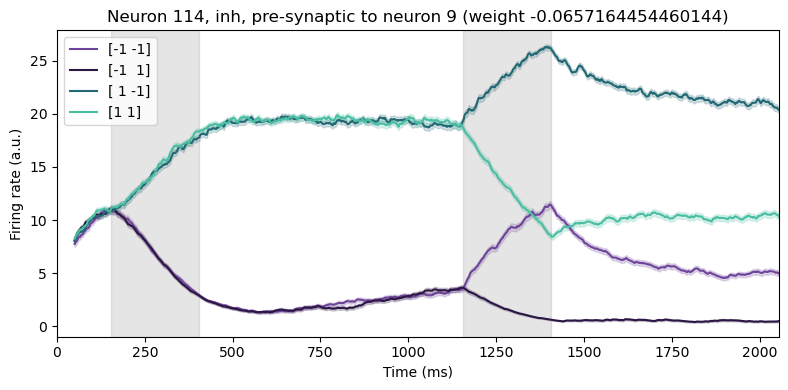

Neuron 177 is pre-synaptic to neuron 9


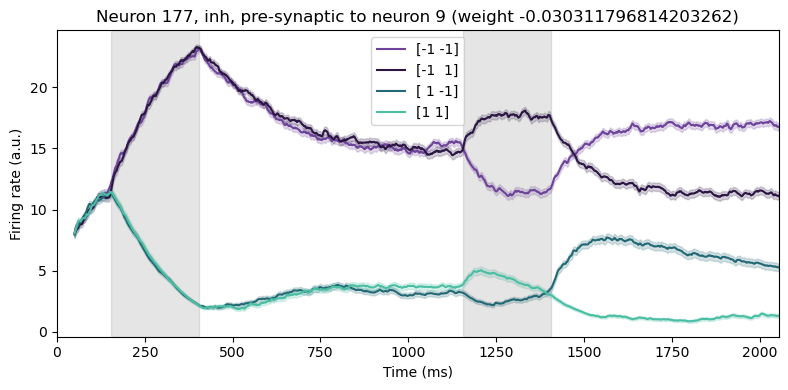

Neuron 179 is pre-synaptic to neuron 9


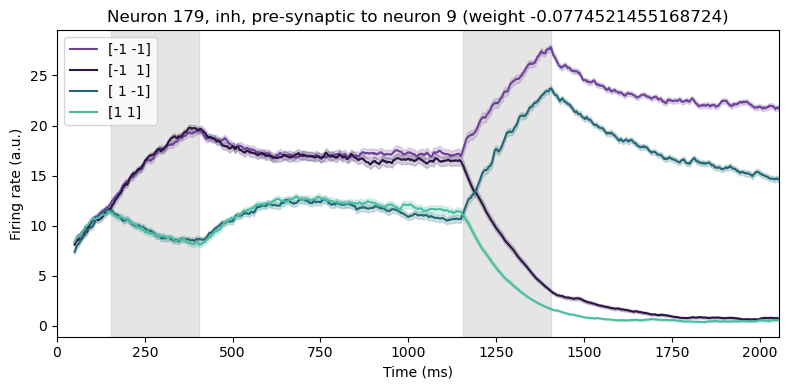

In [52]:
# plot firing rate of neurons pre-synaptic to neuron 9
importlib.reload(sn)
presyn_df = connectivity_df[connectivity_df['postsyn_id'] == 9]
# loop thru dataframe rows
for i, row in presyn_df.iterrows():
    pre_id = row['presyn_id']
    print(f'Neuron {pre_id} is pre-synaptic to neuron 9')
    sn.plot_neuron_rates(model_name, pre_id, condn_phrase, condn_num, cut_off=50,
                         title=f'Neuron {pre_id}, {row["presyn_type"]}, pre-synaptic to neuron 9 (weight {row["weight"]})',)

In [ ]:
# find when neuron 9 is presynaptic
connectivity_df[connectivity_df['presyn_id'] == 9]

,presyn_id,postsyn_id,weight,presyn_type,postsyn_type
74,9,12,-0.040787,inh,exc
75,9,14,-0.009477,inh,exc
76,9,17,-0.034130,inh,exc
77,9,25,-0.064132,inh,exc
78,9,27,-0.047322,inh,exc
79,9,29,-0.027094,inh,exc
80,9,32,-0.040749,inh,exc
81,9,37,-0.049229,inh,exc
82,9,38,-0.033139,inh,exc
83,9,41,-0.048356,inh,exc


Neuron 12 is post-synaptic to neuron 9


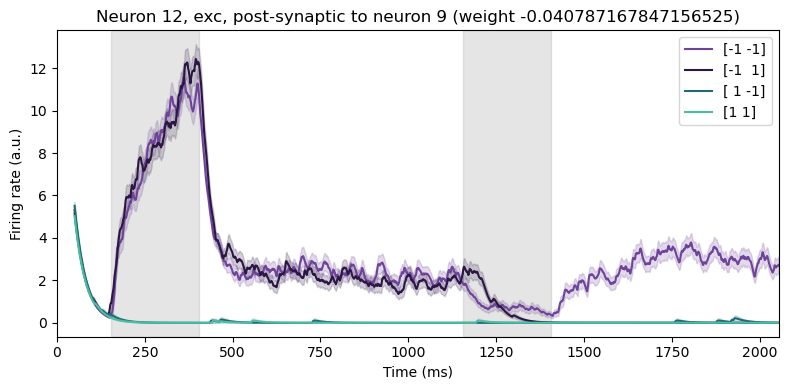

Neuron 14 is post-synaptic to neuron 9


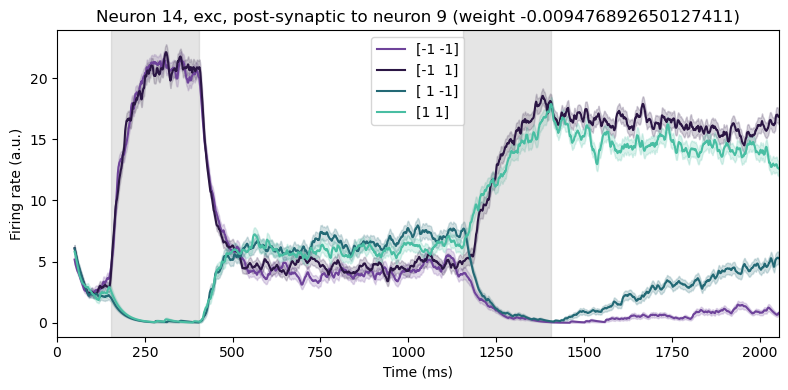

Neuron 17 is post-synaptic to neuron 9


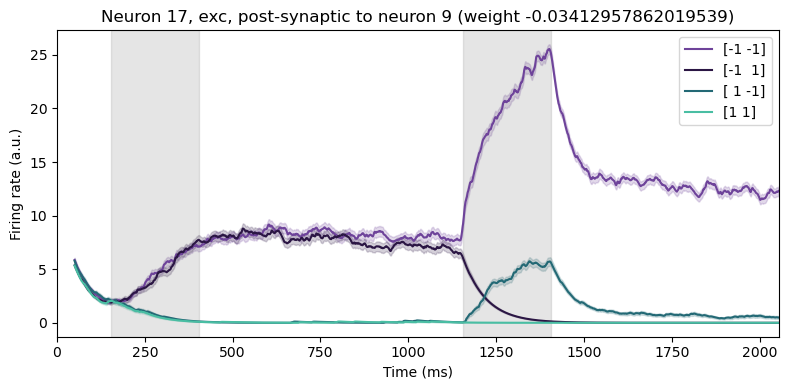

Neuron 25 is post-synaptic to neuron 9


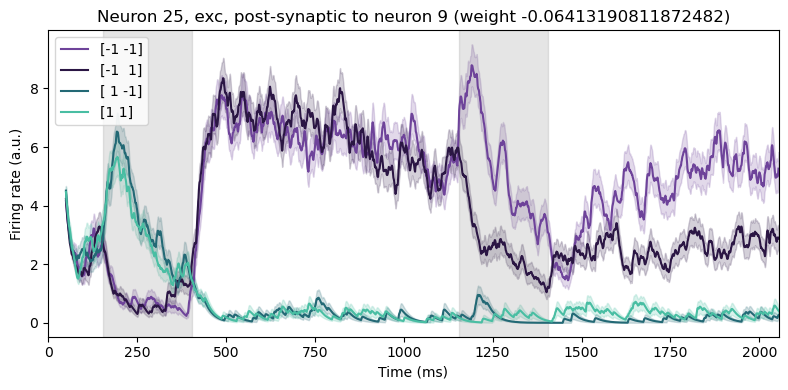

Neuron 27 is post-synaptic to neuron 9


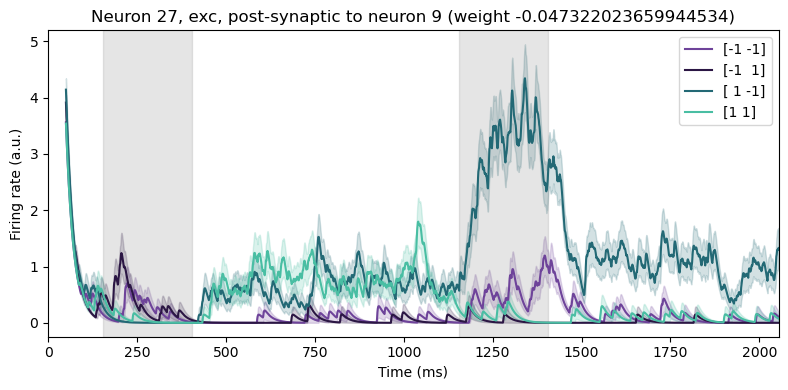

Neuron 29 is post-synaptic to neuron 9


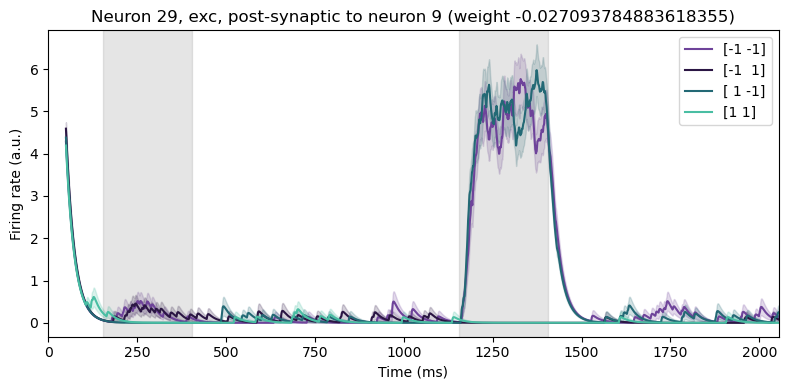

Neuron 32 is post-synaptic to neuron 9


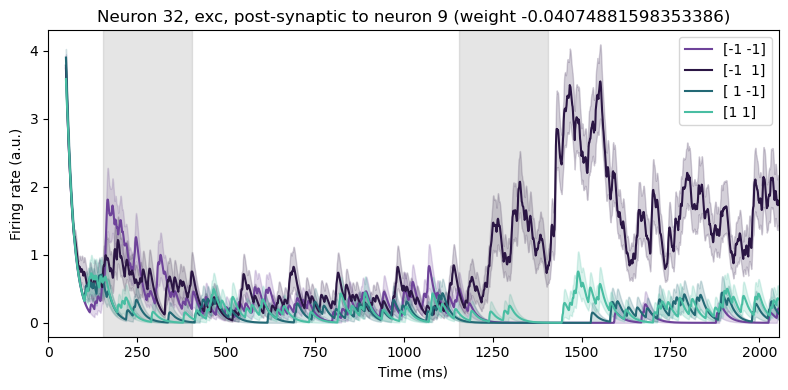

Neuron 37 is post-synaptic to neuron 9


KeyboardInterrupt: 

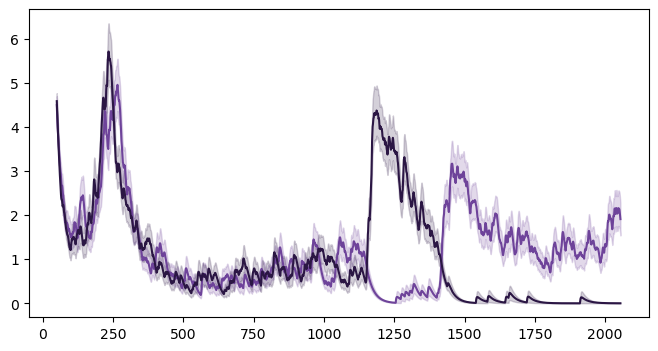

In [49]:
# plot firing rate of neurons post-synaptic to neuron 9
importlib.reload(sn)
postsyn_df = connectivity_df[connectivity_df['presyn_id'] == 9]
postsyn_ids = postsyn_df['postsyn_id'].values
# loop thru dataframe rows
for i, row in postsyn_df.iterrows():
    post_id = row['postsyn_id']
    print(f'Neuron {post_id} is post-synaptic to neuron 9')
    sn.plot_neuron_rates(model_name, post_id, condn_phrase, condn_num, cut_off=50,
                         title=f'Neuron {post_id}, {row["postsyn_type"]}, post-synaptic to neuron 9 (weight {row["weight"]})',)

#### plot a bunch of these

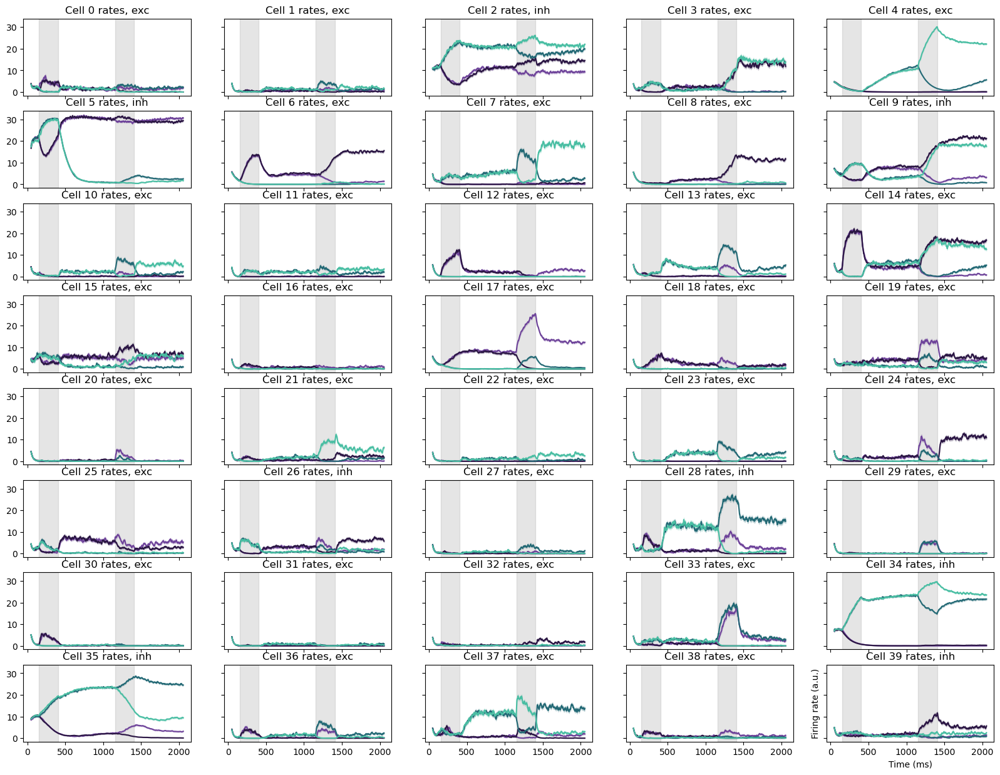

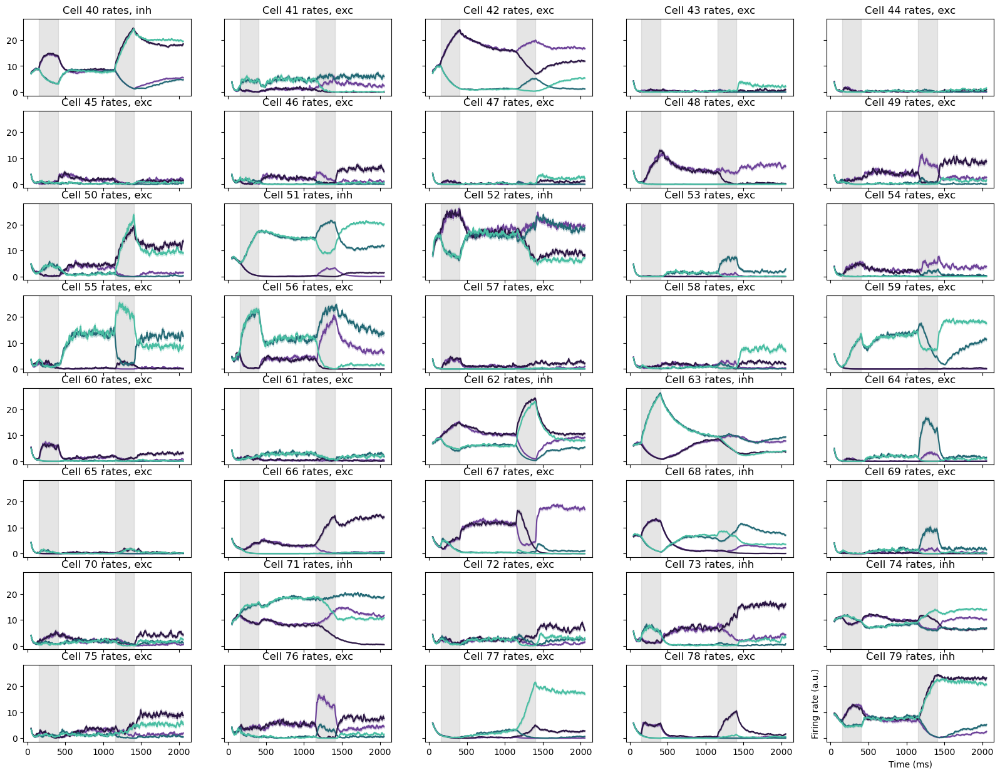

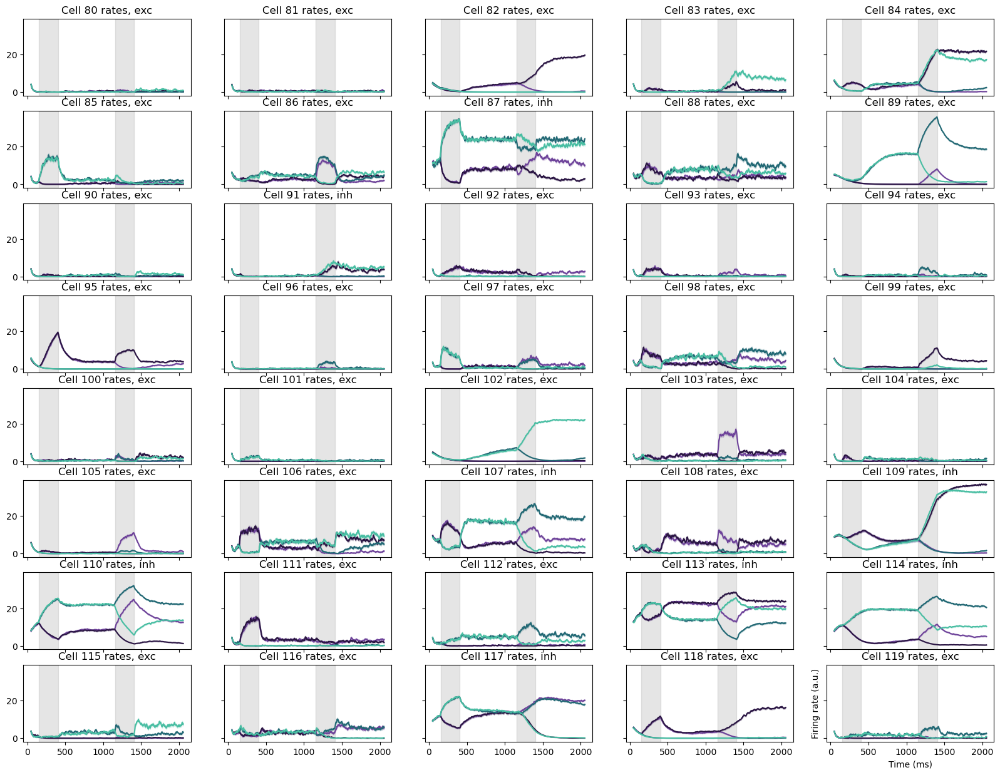

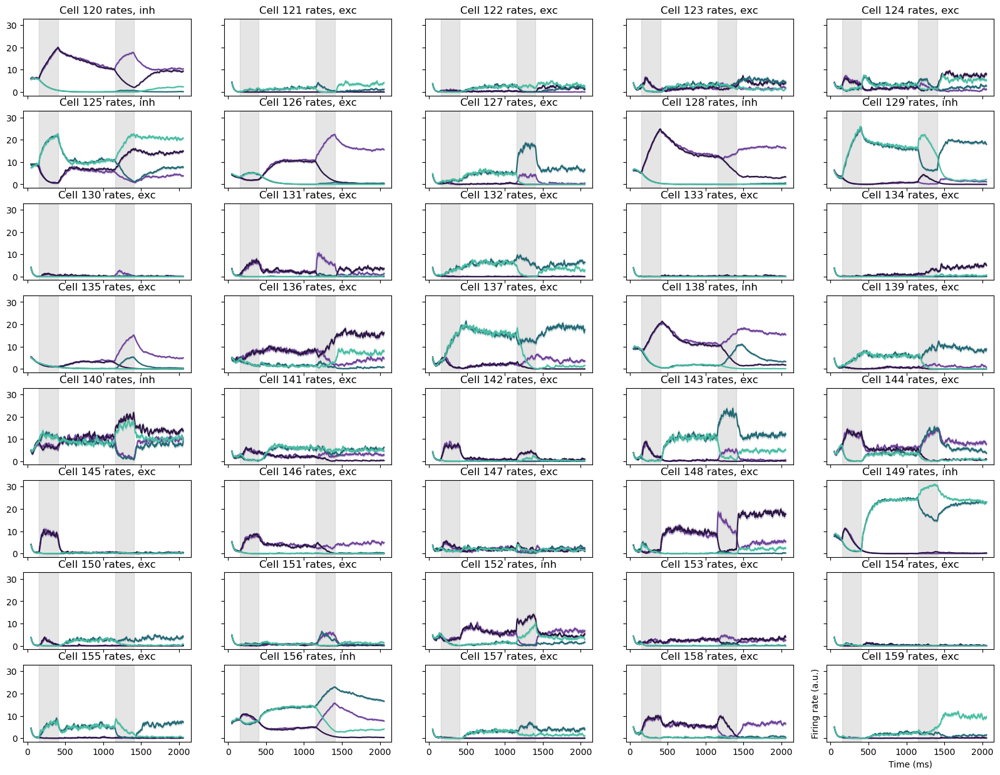

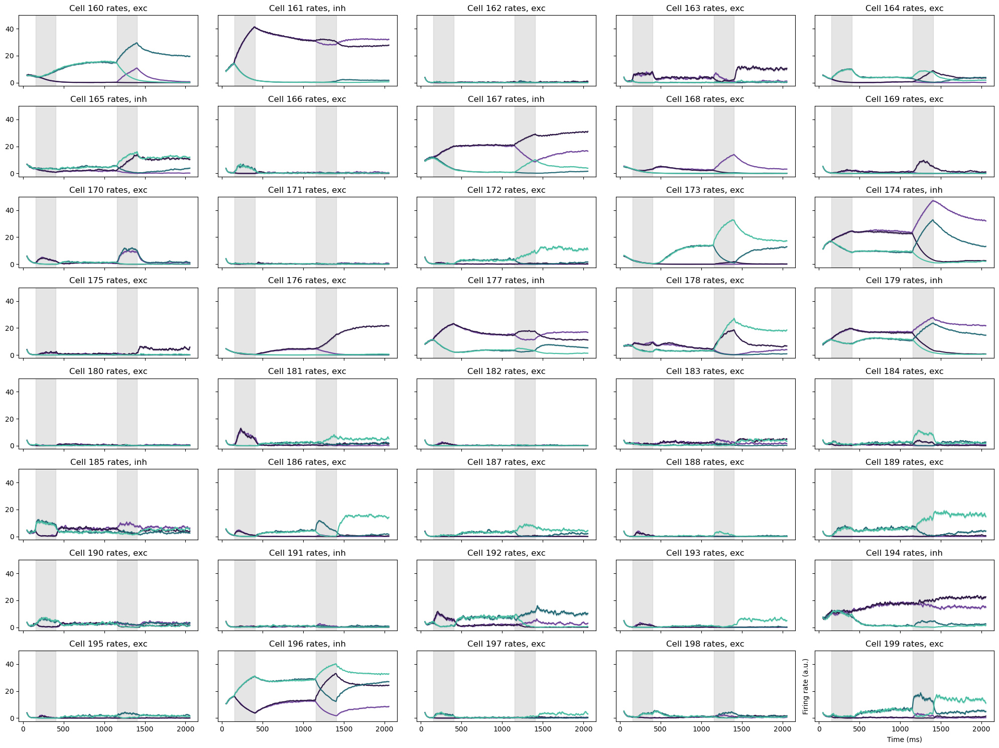

In [ ]:
# plot a grid of these in subplots

importlib.reload(sn)

n_cells = len(spk_times_df['cell_id'].unique())
exc_ind, inh_ind = ld.get_celltype_label(model_name)
cut_off = 50

# behavioral data
trial_labels, trial_perfs = ld.load_bhv_data(model_name, condn_phrase, condn_num)

# get timing info
times_ms, times_real, fs_dict = ld.get_times_dict('ds', condn_phrase, condn_num) #ds is fs=1000, ms

_, colors = sn.get_trialtype_colors()

for n_cell in range(n_cells):
    # plot 40 neurons per figure
    if n_cell % 40 == 0:
        fig, axs = plt.subplots(8, 5, figsize=(20, 15), sharex=True, sharey=True)
        axs = axs.flatten()

    cell_type = 'exc' if n_cell in exc_ind else 'inh'
    rates_data_cell = rates_data[:, n_cell, :]

    # Choose axis for this cell
    ax = axs[n_cell % 40]
    ax.set_title(f"Cell {n_cell} rates, {cell_type}")
    # ax.set_xlabel('Time (ms)')
    # ax.set_ylabel('Trial index')

    # plot firing rate for each trial type
    trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = np.where(trial_idxs == i)[0]
        trials_rate = rates_data_cell[cut_off:, trials_idx]
        # trials_rate = rates_data[cut_off:, cell_id, trials_idx]

        # first just plot mean and sem
        mean_rate = np.mean(trials_rate, axis=1)
        sem_rate = scipy.stats.sem(trials_rate, axis=1)

        ax.plot(np.arange(cut_off,times_ms['T']), mean_rate, color=colors[i], label=f'{trial_type}')
        ax.fill_between(np.arange(cut_off,times_ms['T']), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[i], alpha=0.2)

    # shade stim times
    ax.axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color='gray', alpha=0.2)
    ax.axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color='gray', alpha=0.2)

    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (a.u.)')

# Optionally call plt.tight_layout() or plt.show() outside the loop
plt.tight_layout()
plt.show()


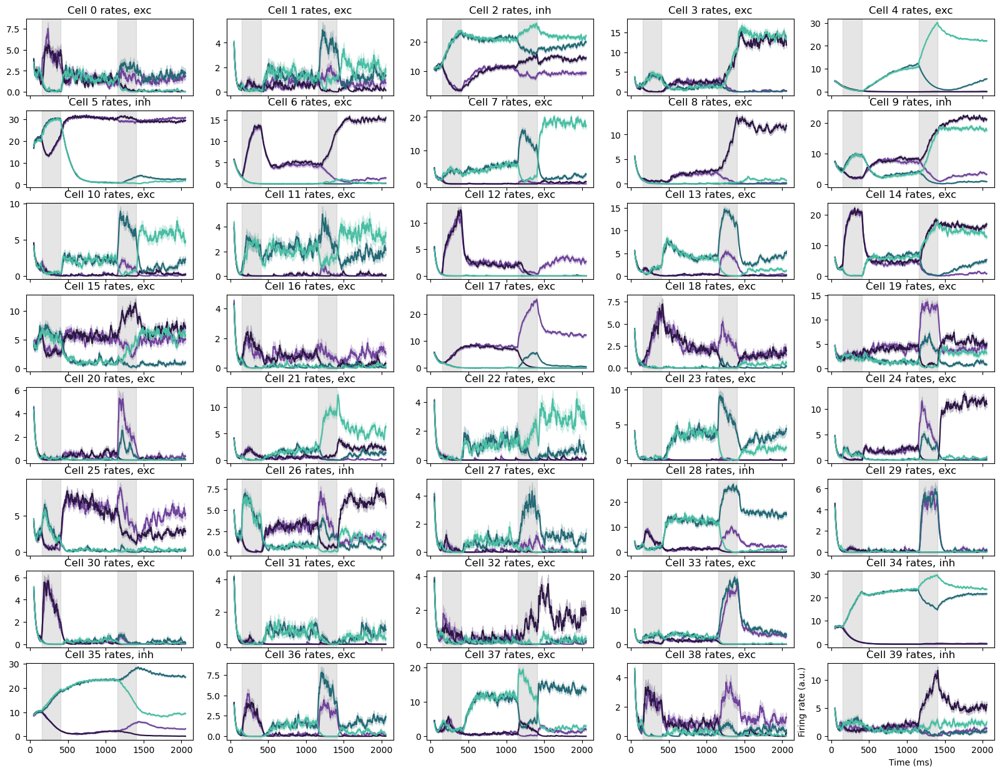

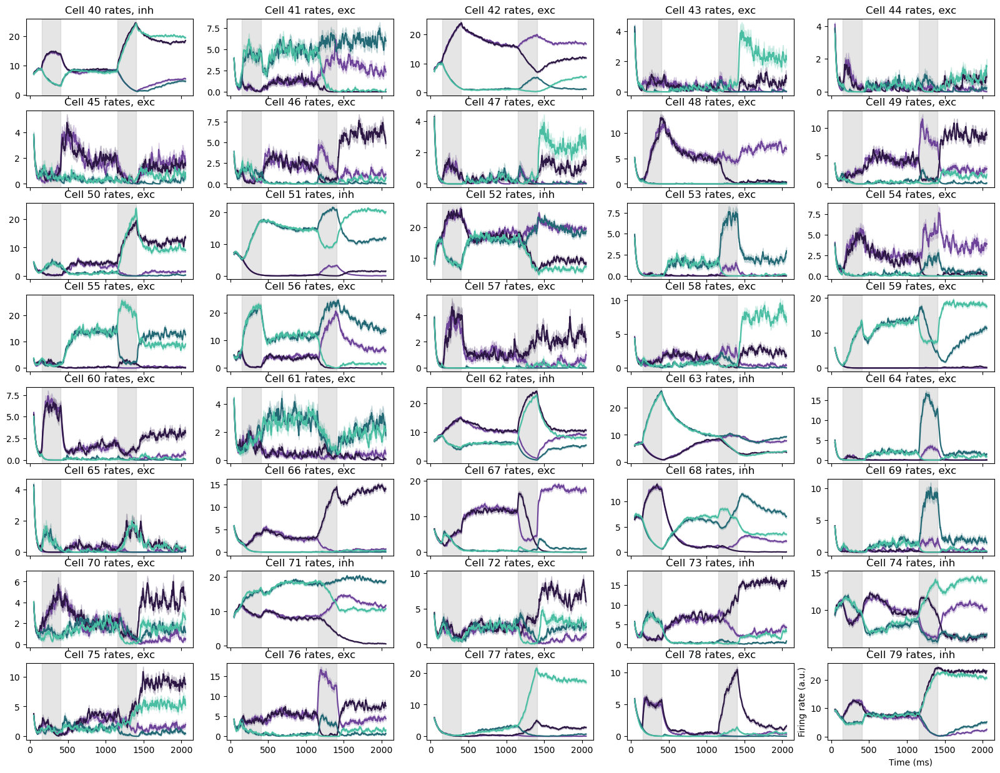

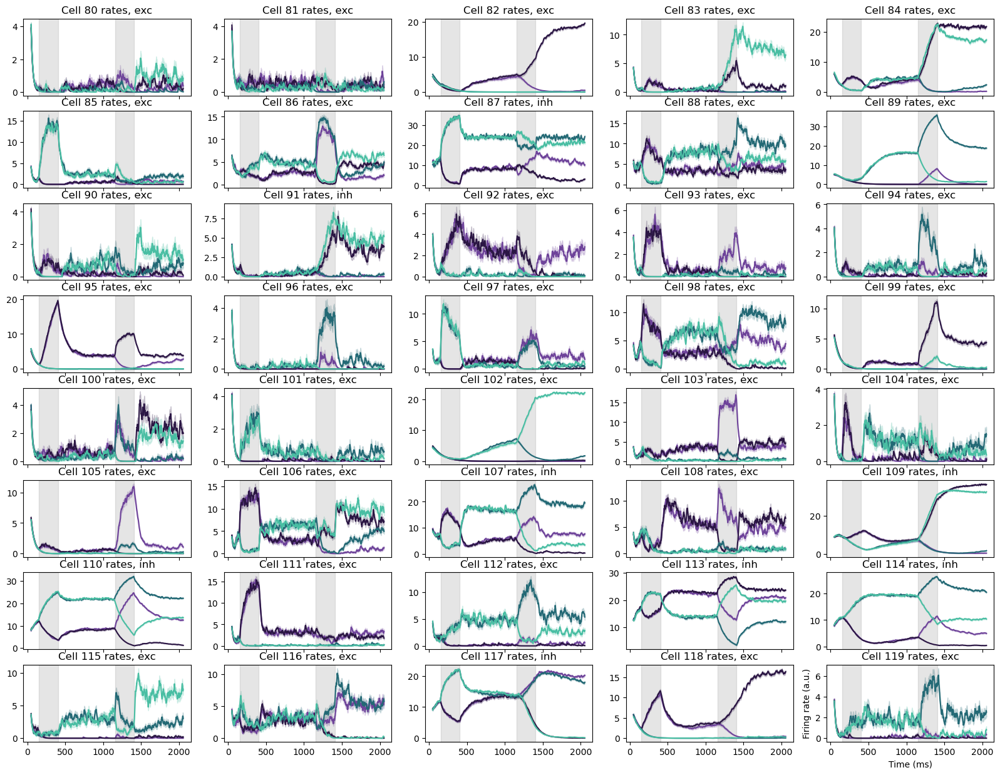

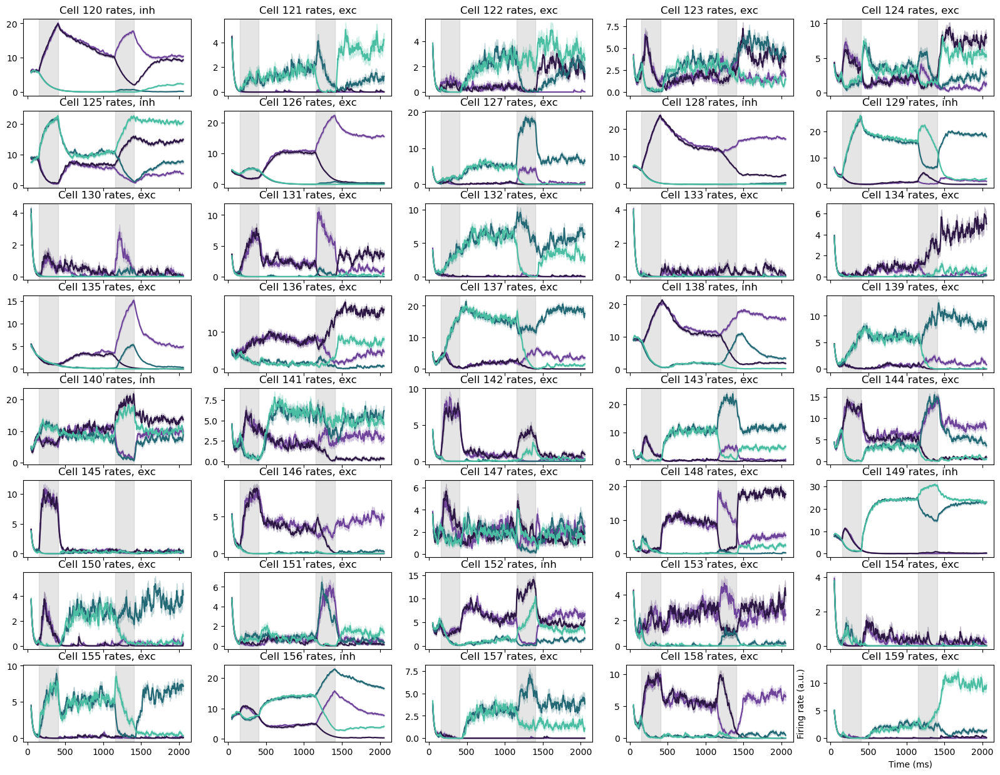

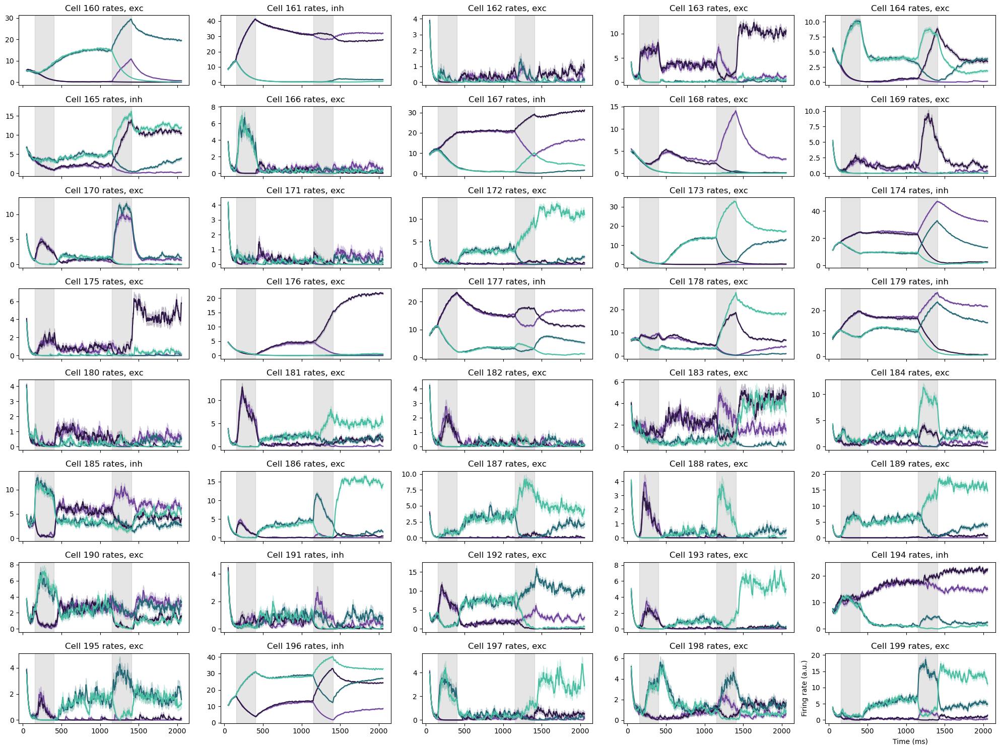

In [9]:
# plot a grid of these in subplots

importlib.reload(sn)

n_cells = len(spk_times_df['cell_id'].unique())
exc_ind, inh_ind = ld.get_celltype_label(model_name)
cut_off = 50

# behavioral data
trial_labels, trial_perfs = ld.load_bhv_data(model_name, condn_phrase, condn_num)

# get timing info
times_ms, times_real, fs_dict = ld.get_times_dict('ds', condn_phrase, condn_num) #ds is fs=1000, ms

_, colors = sn.get_trialtype_colors()

for n_cell in range(n_cells):
    # plot 40 neurons per figure
    if n_cell % 40 == 0:
        fig, axs = plt.subplots(8, 5, figsize=(20, 15), sharex=True)
        axs = axs.flatten()

    cell_type = 'exc' if n_cell in exc_ind else 'inh'
    rates_data_cell = rates_data[:, n_cell, :]

    # Choose axis for this cell
    ax = axs[n_cell % 40]
    ax.set_title(f"Cell {n_cell} rates, {cell_type}")
    # ax.set_xlabel('Time (ms)')
    # ax.set_ylabel('Trial index')

    # plot firing rate for each trial type
    trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        # trials_idx = np.where(trial_idxs == i)[0]
        trials_idx = (trial_idxs == i)
        trials_rate = rates_data_cell[cut_off:, trials_idx]
        # trials_rate = rates_data[cut_off:, cell_id, trials_idx]

        # first just plot mean and sem
        mean_rate = np.mean(trials_rate, axis=1)
        sem_rate = scipy.stats.sem(trials_rate, axis=1)

        ax.plot(np.arange(cut_off,times_ms['T']), mean_rate, color=colors[i], label=f'{trial_type}')
        ax.fill_between(np.arange(cut_off,times_ms['T']), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[i], alpha=0.2)

    # shade stim times
    ax.axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color='gray', alpha=0.2)
    ax.axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color='gray', alpha=0.2)

    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (a.u.)')

# Optionally call plt.tight_layout() or plt.show() outside the loop
plt.tight_layout()
plt.show()


#### scratch work

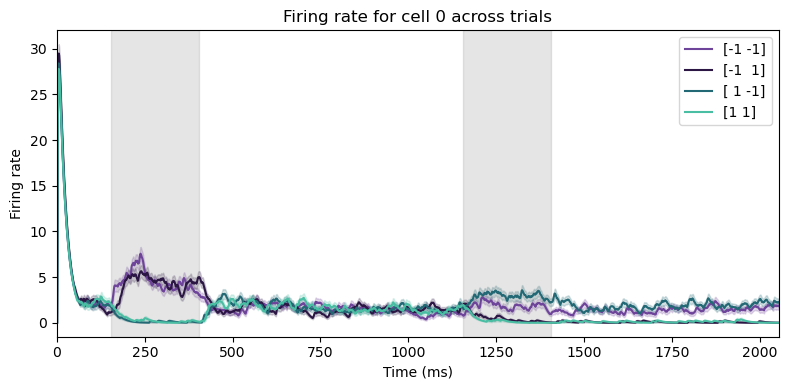

In [ ]:
# plot neuron firing rate across trials

cell_id = 0

colors = ['#6E439A','#2B1644', '#236975','#49BEA3']

times_ms, times_real, fs_dict = ld.get_times_dict('ds', condn_phrase, condn_num) #ds is fs=1000, ms

plt.figure(figsize=(8,4))

# plot firing rate for each trial type
trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)
for i, trial_type in enumerate(trial_types):
    trials_idx = np.where(trial_idxs == i)[0]
    trials_rate = rates_data[:, cell_id, trials_idx]

    # first just plot mean and sem
    mean_rate = np.mean(trials_rate, axis=1)
    sem_rate = scipy.stats.sem(trials_rate, axis=1)

    plt.plot(np.arange(0,times_ms['T']), mean_rate, color=colors[i], label=f'{trial_type}')
    plt.fill_between(np.arange(0,times_ms['T']), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[i], alpha=0.2)

# shade stim times
plt.axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color='gray', alpha=0.2)
plt.axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color='gray', alpha=0.2)

# axes
plt.xlabel('Time (ms)')
plt.ylabel('Firing rate (a.u.)')
plt.title(f'Firing rate for cell {cell_id} across trials')
plt.legend()
plt.xlim(0, times_ms['T'])
# plt.ylim(0, 50)
plt.tight_layout()
plt.show()



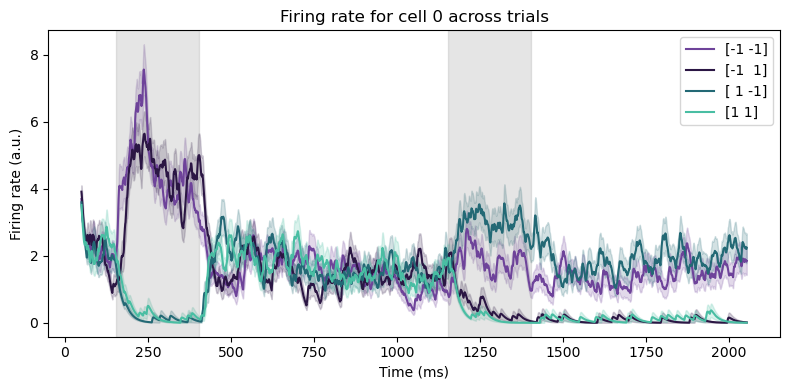

In [18]:
# plot neuron firing rate across trials

cell_id = 0

colors = ['#6E439A','#2B1644', '#236975','#49BEA3']

times_ms, times_real, fs_dict = ld.get_times_dict('ds', condn_phrase, condn_num) #ds is fs=1000, ms

cut_off = 50

plt.figure(figsize=(8,4))

# plot firing rate for each trial type
trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)
for i, trial_type in enumerate(trial_types):
    trials_idx = np.where(trial_idxs == i)[0]
    trials_rate = rates_data[cut_off:, cell_id, trials_idx]

    # first just plot mean and sem
    mean_rate = np.mean(trials_rate, axis=1)
    sem_rate = scipy.stats.sem(trials_rate, axis=1)

    plt.plot(np.arange(cut_off,times_ms['T']), mean_rate, color=colors[i], label=f'{trial_type}')
    plt.fill_between(np.arange(cut_off,times_ms['T']), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[i], alpha=0.2)

# shade stim times
plt.axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color='gray', alpha=0.2)
plt.axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color='gray', alpha=0.2)

# axes
plt.xlabel('Time (ms)')
plt.ylabel('Firing rate (a.u.)')
plt.title(f'Firing rate for cell {cell_id} across trials')
plt.legend()
# plt.ylim(0, 50)
plt.tight_layout()
plt.show()



#### comparing correct and incorrect

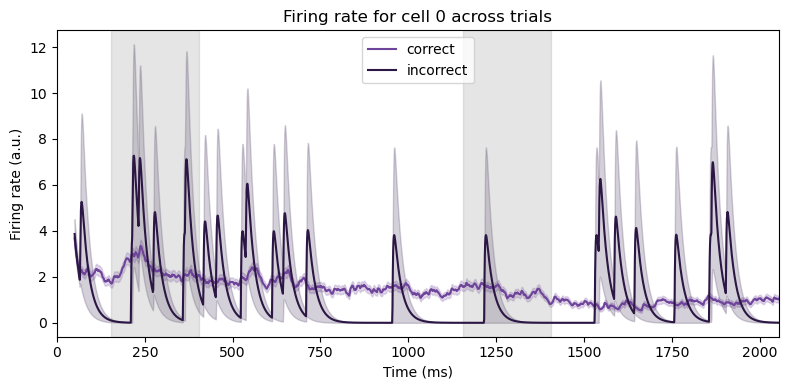

In [10]:
# plot comparison btwn correct and incorrect trials

cell_id = 0
colors = ['#6E439A','#2B1644', '#236975','#49BEA3']
times_ms, times_real, fs_dict = ld.get_times_dict('ds', condn_phrase, condn_num) #ds is fs=1000, ms
cut_off = 50
plt.figure(figsize=(8,4))
# plot firing rate for each trial type
trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)
# get correct and incorrect trials
correct_trials = np.where(trial_perfs == 1)[0]
incorrect_trials = np.where(trial_perfs == 0)[0]
trials_rate = rates_data[cut_off:, cell_id, correct_trials]
# first just plot mean and sem
mean_rate = np.mean(trials_rate, axis=1)
sem_rate = scipy.stats.sem(trials_rate, axis=1)
plt.plot(np.arange(cut_off,times_ms['T']), mean_rate, color=colors[0], label='correct')
plt.fill_between(np.arange(cut_off,times_ms['T']), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[0], alpha=0.2)
# plot firing rate for incorrect trials
trials_rate = rates_data[cut_off:, cell_id, incorrect_trials]
# first just plot mean and sem
mean_rate = np.mean(trials_rate, axis=1)
sem_rate = scipy.stats.sem(trials_rate, axis=1)
plt.plot(np.arange(cut_off,times_ms['T']), mean_rate, color=colors[1], label='incorrect')
plt.fill_between(np.arange(cut_off,times_ms['T']), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[1], alpha=0.2)
# shade stim times
plt.axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color='gray', alpha=0.2)
plt.axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color='gray', alpha=0.2)
# axes
plt.xlabel('Time (ms)')
plt.ylabel('Firing rate (a.u.)')
plt.title(f'Firing rate for cell {cell_id} across trials')
plt.legend()
plt.xlim(0, times_ms['T'])
plt.tight_layout()
plt.show()

/home/nuttidalab/anaconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/anaconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/anaconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/anaconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/tmp/ipykernel_3616960/3174826538.py:22: SmallSampleWarning: All axis-slices of one or more sample arguments are too small; all elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_inc = scipy.stats.sem(trials_ra

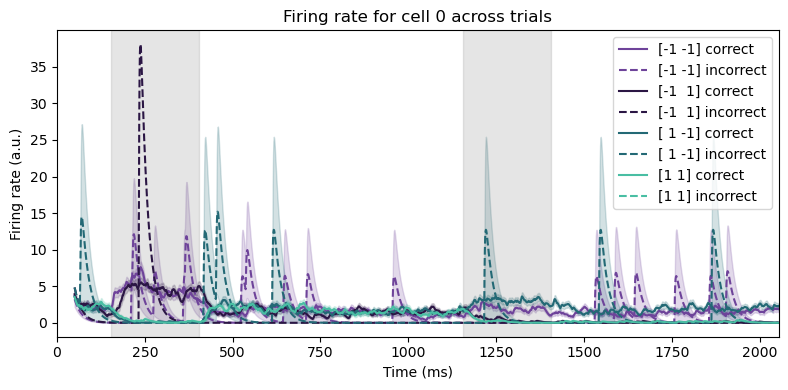

In [13]:
# plot comparison btwn correct and incorrect trials, for each trial type

cell_id = 0
colors = ['#6E439A','#2B1644', '#236975','#49BEA3']
times_ms, times_real, fs_dict = ld.get_times_dict('ds', condn_phrase, condn_num) #ds is fs=1000, ms
cut_off = 50
plt.figure(figsize=(8,4))
# plot firing rate for each trial type
trial_types, trial_idxs = np.unique(trial_labels, axis=0, return_inverse=True)

for i, trial_type in enumerate(trial_types):
    trials_idx = np.where(trial_idxs == i)[0]
    trials_rate = rates_data[cut_off:, cell_id, trials_idx]

    # get correct and incorrect trials
    correct_trials = np.where(trial_perfs[trials_idx] == 1)[0]
    incorrect_trials = np.where(trial_perfs[trials_idx] == 0)[0]

    mean_corr = np.mean(trials_rate[:, correct_trials], axis=1)
    sem_corr = scipy.stats.sem(trials_rate[:, correct_trials], axis=1)
    mean_inc = np.mean(trials_rate[:, incorrect_trials], axis=1)
    sem_inc = scipy.stats.sem(trials_rate[:, incorrect_trials], axis=1)
    # plot firing rate for correct trials
    plt.plot(np.arange(cut_off,times_ms['T']), mean_corr, color=colors[i], label=f'{trial_type} correct')
    plt.fill_between(np.arange(cut_off,times_ms['T']), mean_corr-sem_corr, mean_corr+sem_corr, color=colors[i], alpha=0.2)
    # plot firing rate for incorrect trials
    plt.plot(np.arange(cut_off,times_ms['T']), mean_inc, color=colors[i], linestyle='--', label=f'{trial_type} incorrect')
    plt.fill_between(np.arange(cut_off,times_ms['T']), mean_inc-sem_inc, mean_inc+sem_inc, color=colors[i], alpha=0.2)
# shade stim times
plt.axvspan(times_ms['stim1_on'], times_ms['stim1_off'], color='gray', alpha=0.2)
plt.axvspan(times_ms['stim2_on'], times_ms['stim2_off'], color='gray', alpha=0.2)
# axes
plt.xlabel('Time (ms)')
plt.ylabel('Firing rate (a.u.)')
plt.title(f'Firing rate for cell {cell_id} across trials')
plt.legend()
plt.xlim(0, times_ms['T'])
plt.tight_layout()
plt.show()